In [1]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

# Visualization
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.graph_objects as go
%matplotlib inline
from matplotlib import pyplot as plt
import seaborn as sns


# Tools for predictive data analysis
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster import hierarchy 
from scipy.spatial import distance_matrix 
from sklearn.cluster import DBSCAN
from sklearn.cluster import MeanShift, estimate_bandwidth

In [2]:
df = pd.read_csv('Data/final_customer.csv')
display(df.head())
df.describe()

,user_id,gender,age,income,customer score
0,1,Male,55.0,112000,11
1,3,Male,68.0,70000,13
2,5,Female,58.0,51000,5
3,8,Female,62.0,71000,4
4,12,Female,40.0,71000,6


,user_id,age,income,customer score
count,12950.000000,12950.000000,12950.000000,12950.000000
mean,7423.445869,53.380011,65329.266409,16.633668
std,4274.906366,17.079656,21583.713051,16.770312
min,1.000000,18.000000,30000.000000,4.000000
25%,3744.250000,41.250000,49000.000000,6.000000
50%,7392.500000,55.000000,63000.000000,10.000000
75%,11128.750000,66.000000,79000.000000,20.000000
max,14824.000000,90.000000,120000.000000,100.000000


## Plotting Gender

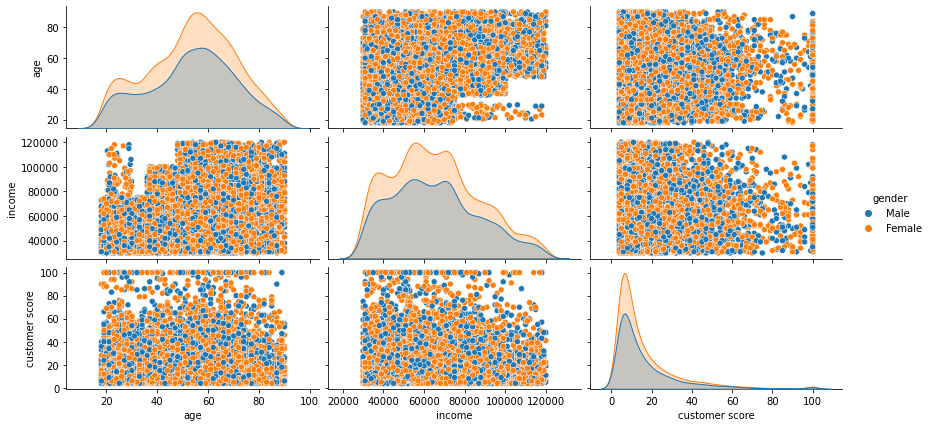

In [3]:
#create plots
df_plot = df.drop(['user_id'], axis=1)
# px.scatter_matrix(df_plot, dimensions=['age', 'income','customer score'], color='gender')
sns.pairplot(df_plot, hue='gender', height=2, aspect=2);

#### After plotting gender we can see that there isn't a direct relation in order to segment the customers using this feature. However we can note interesting patterns like the relation between Income and Score or Age and Score, so we will choose to focus on those categories

In [4]:
#As We don't need the gender attribute or customer_id for segmenting customers so let's drop it 
df2 = df.drop(['user_id','gender'], axis=1)

In [5]:
n_clusters = []
res_clusters = []

for i in range (1, 11):
    knn_model = KMeans(n_clusters=i).fit(df2)
    n_clusters.append(i)
    res_clusters.append(knn_model.inertia_) # inertia_: Sum of squared distances of samples to their closest cluster center.

df_knn = pd.DataFrame(data= {'n_clusters': n_clusters, 'res_clusters':res_clusters})

## Elbow Curve

We have created several KNN models with different number of clusters (1-10). We have to choose a number cluster in a way that:

* The sum of squared distances of samples to their closest cluster center (inertia_) is minimum as possible.
* The number of clusters is maximum of possible. More clusters allows us to make sure we can identify specific groups of customers  

In [12]:
fig = px.line(df_knn, x="n_clusters", y="res_clusters")
fig.add_shape(type="rect", xref="x", yref="y", x0=3, y0=400*1000, x1=5, y1=1,
line=dict(color="red",width=3,), fillcolor="crimson", opacity=0.2)
fig.update_layout(
    title="KNN - The Elbow Method",
    xaxis_title="intertia", yaxis_title="# Clusters",
    font=dict(family="Arial", size=10, color="#262b35")
)

fig.show()

Looking the next plots, seems that the best choice is using 3-5 clusters before innertia drops off.  (we can't know for sure if this is the best way of labeling the data due to this is a unsupervised problem though). W

We hope to segment and categorize the customers by the following charecteristics;

* Label 0 is low income and low spending
* Label 1 is high income and high spending
* Label 2 is mid income and mid spending
* Label 3 is high income and low spending
* Label 4 is low income and high spending

In [13]:
def knn_visuals(dataset, nc):
    model = KMeans(n_clusters=nc).fit(dataset)
    dataset['labels'] = model.labels_
    return (dataset)

df_knn3,df_knn4,df_knn5 = df2.copy(),df2.copy(),df2.copy()

knn3 = knn_visuals(df_knn3, 3)
knn4 = knn_visuals(df_knn4, 4)
knn5 = knn_visuals(df_knn5, 5)

In [14]:
fig = make_subplots(rows=1, cols=3 ,x_title='Income',y_title='Score', subplot_titles=("3 Clusters", "4 Clusters", "5 Clusters"))
fig.add_trace(go.Scatter(x=knn3['income'], y=knn3['customer score'], mode='markers', marker=dict(colorscale='rainbow'), marker_color=knn3['labels'], text=knn3['labels']), row=1, col=1)
fig.add_trace(go.Scatter(x=knn4['income'], y=knn4['customer score'], mode='markers', marker=dict(colorscale='rainbow'), marker_color=knn4['labels'], text=knn4['labels']), row=1, col=2)
fig.add_trace(go.Scatter(x=knn5['income'], y=knn5['customer score'], mode='markers', marker=dict(colorscale='rainbow'), marker_color=knn5['labels'], text=knn5['labels']), row=1, col=3)
fig.update_layout(
    title="Clustering - KNN Model",
    font=dict(family="Arial", size=10, color="#262b35"),
    showlegend=False
)

fig.show()

In [15]:
fig = make_subplots(rows=1, cols=2 ,x_title='Label', subplot_titles=("Clustering for Income", "Clustering for Score"))

labels = sorted(knn5.labels.unique())

for l in labels:
    fig.add_trace(go.Violin(x=knn5['labels'][knn5['labels'] == l], y=knn5['income'][knn5['labels'] == l], name=str(l), box_visible=True, meanline_visible=True),row=1, col=1)
    fig.add_trace(go.Violin(x=knn5['labels'][knn5['labels'] == l], y=knn5['customer score'][knn5['labels'] == l], name=str(l), box_visible=True, meanline_visible=True),row=1, col=2)

fig.update_layout(
    title="Clustering - Attributes per Cluster",
    font=dict(family="Arial", size=10, color="#262b35"),
    showlegend=False
)

fig.show()

##   Hierarchical Clustering

##### Aggloomerative Hierarchical Clustering

Hierarchical clustering is a general family of clustering algorithms that build nested clusters by merging or splitting them successively. This hierarchy of clusters is represented as a tree (or dendrogram). The root of the tree is the unique cluster that gathers all the samples, the leaves being the clusters with only one sample.

AgglomerativeClustering can also scale to large number of samples when it is used jointly with a connectivity matrix, but is computationally expensive when no connectivity constraints are added between samples: it considers at each step all the possible merges.

This is a type of clustering that requires two types of inputs:

* n_clusters: Number of clusters or centroids to generate.
* linkage: Which linkage criterion to use. The linkage criterion determines which distance to use between sets of observation. The algorithm will merge the pairs of cluster that minimize this criterion.:
  *‘ward’ minimizes the variance of the clusters being merged.
  *‘average’ uses the average of the distances of each observation of the two sets.
  *‘complete’ or ‘maximum’ linkage uses the maximum distances between all observations of the two sets.
  *'single’ uses the minimum of the distances between all observations of the two sets.


In [16]:
linkages = ['ward','average','complete','single']

def apply_AgglomerativeClustering(df, n, l):
    model = AgglomerativeClustering(n_clusters=4, linkage='average').fit(df)
    df['labels'] = model.labels_
    return (df)


df_ward_plot = apply_AgglomerativeClustering(df2.copy(), 5, linkages[0])
df_avg_plot = apply_AgglomerativeClustering(df2.copy(), 5, linkages[1])
df_com_plot = apply_AgglomerativeClustering(df2.copy(), 5, linkages[2])
df_sin_plot = apply_AgglomerativeClustering(df2.copy(), 5, linkages[3])



fig = make_subplots(rows=1, cols=2 ,x_title='Income',y_title='Customer Score', subplot_titles=("AgglomerativeClustering", "KNN"))
fig.add_trace(go.Scatter(x=df_ward_plot['income'], y=df_ward_plot['customer score'], mode='markers', marker=dict(colorscale='rainbow'), marker_color=df_ward_plot['labels'], text=df_ward_plot['labels']), row=1, col=1)
fig.add_trace(go.Scatter(x=knn4['income'], y=knn4['customer score'], mode='markers', marker=dict(colorscale='rainbow'), marker_color=knn4['labels'], text=knn4['labels']), row=1, col=2)
fig.update_layout(showlegend=False)

Agglomerative Hierarchical Clustering - Dendogram
It’s possible to visualize the tree representing the hierarchical merging of clusters as a dendrogram. Visual inspection can often be useful for understanding the structure of the data, though more so in the case of small sample sizes.

It’s possible to get the distance matrix that contains the distance from each point to every other point of a dataset. Will be useful for using it with the linkage class.
Using the hierarchy.linkage function, we'll be able to perform hierarchical/agglomerative clustering. This function cut hierarchical clusterings into flat clusterings or find the roots of the forest formed by a cut by providing the flat cluster ids of each observation.

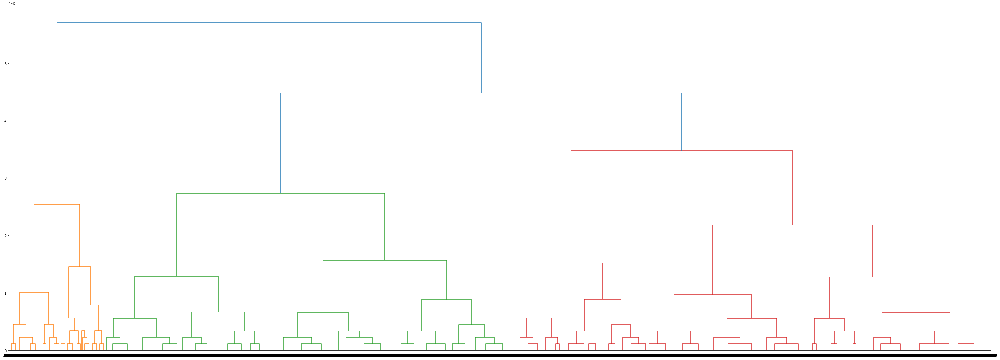

In [17]:
# Get distance matrix
distance = distance_matrix(df2, df2)
# Get hierarchy
Z = hierarchy.linkage(distance, 'complete');
plt.figure(figsize=(50, 18))
hierarchy.dendrogram(Z, leaf_rotation=0, leaf_font_size=12, orientation='top');

  Density Based Clustering (DBSCAN)
K-means, hierarchical and fuzzy clustering perform really well in non-supervised data, however, for tasks with arbitrary shape clusters or clusters within clusters, those techniques might perform poorly (that's because elements in the same cluster might not share similarities).

The DBSCAN algorithm views clusters as areas of high density separated by areas of low density. Due to this rather generic view, clusters found by DBSCAN can be any shape, as opposed to k-means which assumes that clusters are convex shaped.

The central component to the DBSCAN is the concept of core samples, which are samples that are in areas of high density. A cluster is therefore a set of core samples, each close to each other (measured by some distance measure) and a set of non-core samples that are close to a core sample (but are not themselves core samples).

The whole idea is that if a particular point belongs to a cluster, it should be near to lots of other points in that cluster.Note: Density = Number of points within a specified radius.

DBSCAN uses two different parameters:

Epsilon: Determines a specified radius that if includes enough number of points within, we call it dense area.
minimumSamples: Determines the minimum number of data points we want in a neighborhood to define a cluster.

In [18]:
df_dbscan = df2.copy()
model = DBSCAN(eps=11, min_samples=6).fit(df_dbscan)
df_dbscan['labels'] = model.labels_

fig = make_subplots(rows=1, cols=2 ,x_title='Income',y_title='Customer Score', subplot_titles=("DBSCAN", "KNN"))
fig.add_trace(go.Scatter(x=df_dbscan['income'], y=df_dbscan['customer score'], mode='markers', marker=dict(colorscale='rainbow'), marker_color=df_dbscan['labels'], text=df_dbscan['labels']), row=1, col=1)
fig.add_trace(go.Scatter(x=knn5['income'], y=knn5['customer score'], mode='markers', marker=dict(colorscale='rainbow'), marker_color=knn5['labels'], text=knn5['labels']), row=1, col=2)
fig.update_layout(showlegend=False)

Is possible to see that DBSCAN doesn't perform well. The density in the data is not strong enough (we can see that we have labels -1).

### Mean Shift Algorithm
Centroid based algorithm which goal is finding blobs in a smooth density of samples. It works as next:

Updating candidates for centroids to be the mean of the points withing a given region.
Those candidates are filtered in a post-processing stage to eliminate near-duplicates to form the final set of centroids.
The algorithm sets the number of clusters (instead of relying on a paremeter bandwith that dictates the size of the region for searching).
The central component to the DBSCAN is the concept of core samples, which are samples that are in areas of high density. A cluster is therefore a set of core samples, each close to each other (measured by some distance measure) and a set of non-core samples that are close to a core sample (but are not themselves core samples).

The algorithm is not highly scalable, as it requires multiple nearest neighbor searches during the execution of the algorithm. The algorithm is guaranteed to converge, however the algorithm will stop iterating when the change in centroids is small.

In [20]:
df_mean = df2.copy()


bandwidth = estimate_bandwidth(df_mean, quantile=0.1)
model = MeanShift(bandwidth).fit(df_mean)
df_mean['labels'] = model.labels_

fig = make_subplots(rows=1, cols=2 ,x_title='income',y_title='customer score', subplot_titles=("DBSCAN", "KNN"))
fig.add_trace(go.Scatter(x=df_mean['income'], y=df_mean['customer score'], mode='markers', marker=dict(colorscale='rainbow'), marker_color=df_mean['labels'], text=df_mean['labels']), row=1, col=1)
fig.add_trace(go.Scatter(x=knn5['income'], y=knn5['customer score'], mode='markers', marker=dict(colorscale='rainbow'), marker_color=knn5['labels'], text=knn5['labels']), row=1, col=2)
fig.update_layout(showlegend=False)

### Summary
Most of the algorithms use 5 clusters (except DBSCAN).


In [21]:
#expand on summary